# Project: Credit Classification

We want to build a model to identify low credit customers. 

# Data Prep & EDA

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV

credit_df = pd.read_csv("../Data/credit_train_clean.csv").drop(["Name", "SSN", "ID", "Customer_ID"], axis=1)

credit_df.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,1,23.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"auto loan,credit-builder loan,personal loan,ho...",...,Good,809.98,26.822620,265.0,No,49.574949,21.46538,High_spent_Small_value_payments,312.494089,Good
1,2,23.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"auto loan,credit-builder loan,personal loan,ho...",...,Good,809.98,31.944960,266.0,No,49.574949,21.46538,Low_spent_Large_value_payments,284.629162,Good
2,3,23.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"auto loan,credit-builder loan,personal loan,ho...",...,Good,809.98,28.609352,267.0,No,49.574949,21.46538,Low_spent_Medium_value_payments,331.209863,Good
3,4,23.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"auto loan,credit-builder loan,personal loan,ho...",...,Good,809.98,31.377862,268.0,No,49.574949,21.46538,Low_spent_Small_value_payments,223.451310,Good
4,5,23.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"auto loan,credit-builder loan,personal loan,ho...",...,Good,809.98,24.797347,269.0,No,49.574949,21.46538,High_spent_Medium_value_payments,341.489231,Good


In [18]:
credit_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     100000 non-null  int64  
 1   Age                       100000 non-null  float64
 2   Occupation                100000 non-null  object 
 3   Annual_Income             100000 non-null  float64
 4   Monthly_Inhand_Salary     100000 non-null  float64
 5   Num_Bank_Accounts         100000 non-null  float64
 6   Num_Credit_Card           100000 non-null  float64
 7   Interest_Rate             100000 non-null  float64
 8   Num_of_Loan               100000 non-null  float64
 9   Type_of_Loan              100000 non-null  object 
 10  Delay_from_due_date       100000 non-null  float64
 11  Num_of_Delayed_Payment    100000 non-null  float64
 12  Changed_Credit_Limit      100000 non-null  float64
 13  Num_Credit_Inquiries      100000 non-null  fl

In [19]:
credit_df['Credit_Score'].value_counts()

Credit_Score
Standard    53174
Poor        28998
Good        17828
Name: count, dtype: int64

In [2]:
#we can classify 'standard' and 'good' credit scores as 1 and 'poor' as 0
credit_df['credit_score_value'] = np.where(credit_df['Credit_Score'] == 'Poor', 0, 1)
credit_df[credit_df['credit_score_value'] == 0]

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,credit_score_value
56,1,30.0,Media_Manager,34081.38,2611.115000,8.0,7.0,15.0,3.0,"not specified,auto loan,student loan",...,1704.18,24.448063,176.0,NM,70.478333,29.326364,Low_spent_Large_value_payments,298.192158,Poor,0
57,2,30.0,Media_Manager,34081.38,2611.115000,8.0,7.0,15.0,3.0,"not specified,auto loan,student loan",...,1704.18,35.171160,176.0,Yes,70.478333,29.326364,High_spent_Large_value_payments,392.196185,Poor,0
58,3,30.0,Media_Manager,34081.38,2611.115000,8.0,7.0,15.0,3.0,"not specified,auto loan,student loan",...,1704.18,35.111552,177.0,Yes,70.478333,29.326364,Low_spent_Large_value_payments,260.912402,Poor,0
59,4,30.0,Media_Manager,34081.38,2611.115000,8.0,7.0,15.0,3.0,"not specified,auto loan,student loan",...,1704.18,29.762159,178.0,Yes,70.478333,29.326364,Low_spent_Small_value_payments,260.080975,Poor,0
63,8,30.0,Media_Manager,34081.38,2611.115000,8.0,7.0,15.0,3.0,"not specified,auto loan,student loan",...,1704.18,33.823488,182.0,Yes,70.478333,29.326364,High_spent_Medium_value_payments,411.306804,Poor,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,3,25.0,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"auto loan,student loan",...,502.38,39.323569,377.0,No,35.104023,24.028477,High_spent_Medium_value_payments,410.256158,Poor,0
99995,4,25.0,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"auto loan,student loan",...,502.38,34.663572,378.0,No,35.104023,24.028477,High_spent_Large_value_payments,479.866228,Poor,0
99996,5,25.0,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"auto loan,student loan",...,502.38,40.565631,379.0,No,35.104023,24.028477,High_spent_Medium_value_payments,496.651610,Poor,0
99997,6,25.0,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"auto loan,student loan",...,502.38,41.255522,380.0,No,35.104023,24.028477,High_spent_Large_value_payments,516.809083,Poor,0


<Axes: xlabel='credit_score_value'>

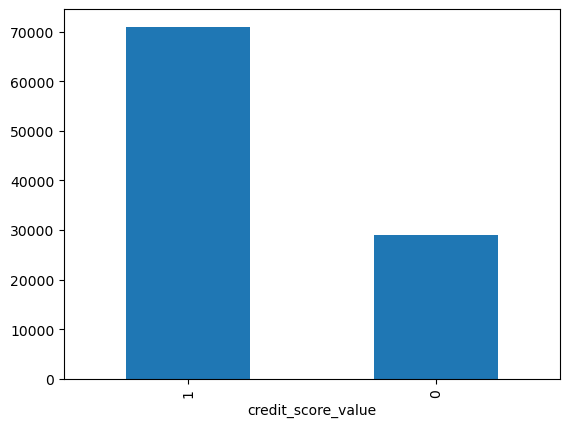

In [21]:
# checking targer variable
# we can see that we have imbalanced data
credit_df['credit_score_value'].value_counts().plot.bar()

C:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ASUS\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating ins

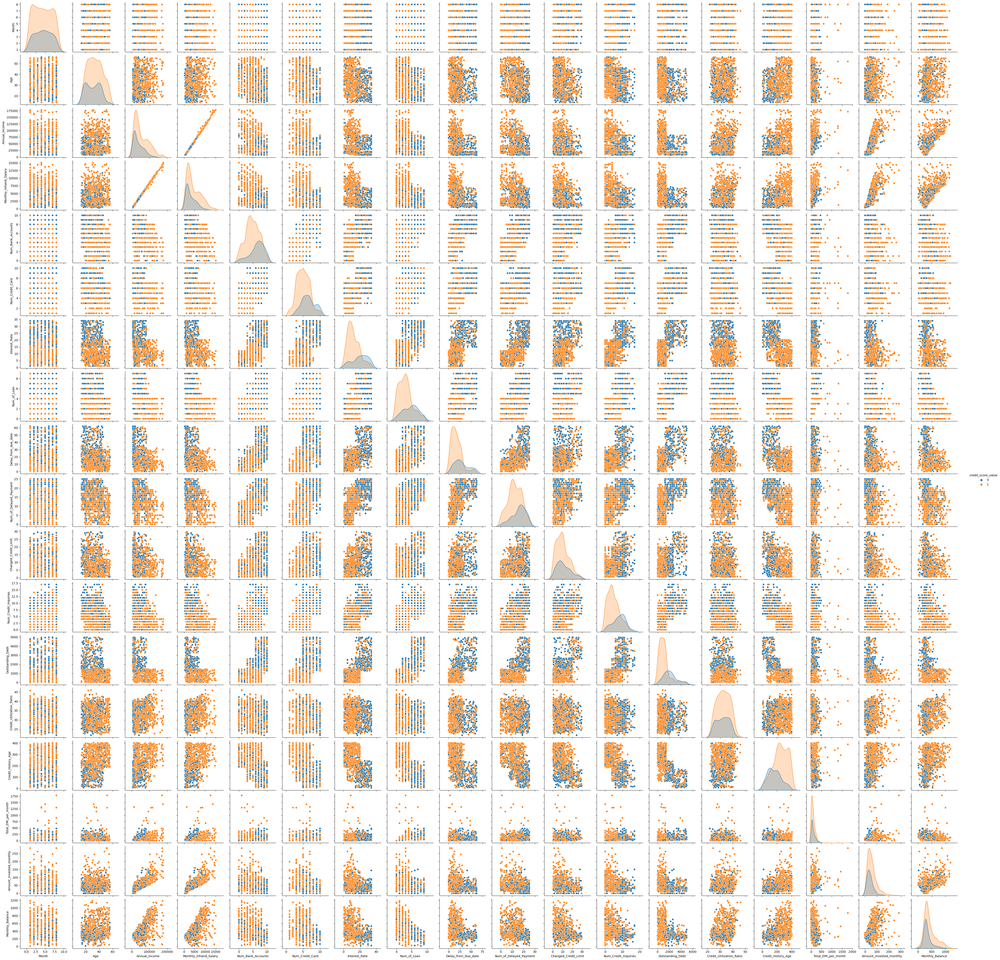

In [35]:
# checking numeric features
# we can see that some of the features are highly correlated and its better to not use all of them in our model. for example annual income and monthly inhand salary
# by checking target column in the below table we can see which features distinct our data more than others
sns.pairplot(credit_df.sample(1000), hue='credit_score_value')

<Axes: xlabel='Occupation'>

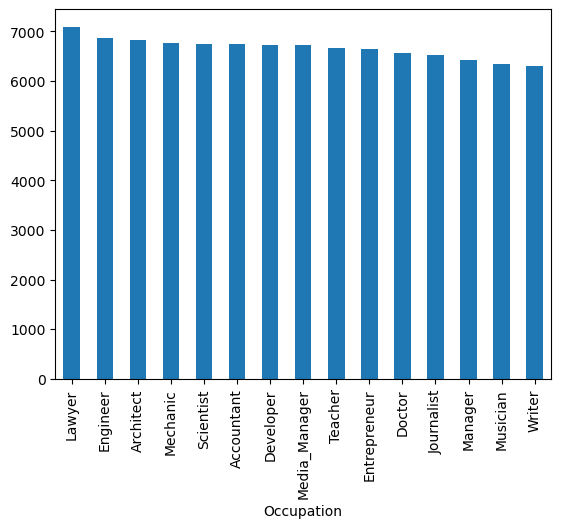

In [23]:
# checking categorical features
credit_df['Occupation'].value_counts().plot.bar()

In [5]:
# checking categorical features
credit_df['Type_of_Loan'].value_counts()

Type_of_Loan
No Data                                                                                                                     11408
not specified                                                                                                                1408
credit-builder loan                                                                                                          1280
personal loan                                                                                                                1272
debt consolidation loan                                                                                                      1264
                                                                                                                            ...  
not specified,mortgage loan,auto loan,payday loan                                                                               8
payday loan,mortgage loan,debt consolidation loan,student loan               

<Axes: xlabel='Credit_Mix'>

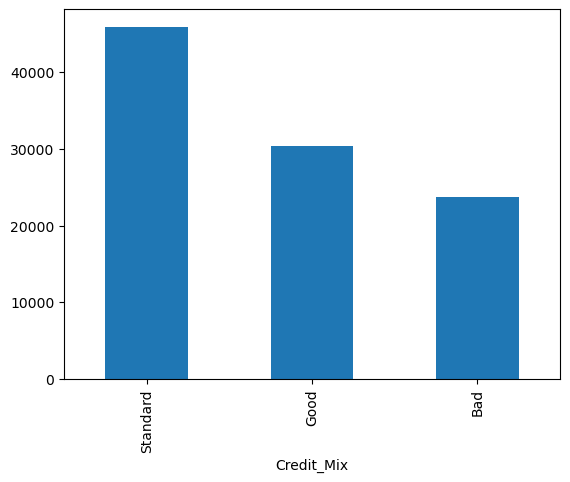

In [11]:
# checking categorical features
credit_df['Credit_Mix'].value_counts().plot.bar()

<Axes: xlabel='Payment_of_Min_Amount'>

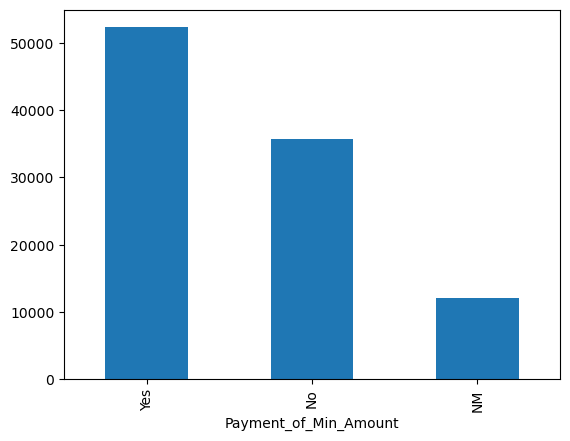

In [12]:
# checking categorical features
credit_df['Payment_of_Min_Amount'].value_counts().plot.bar()

<Axes: xlabel='Payment_Behaviour'>

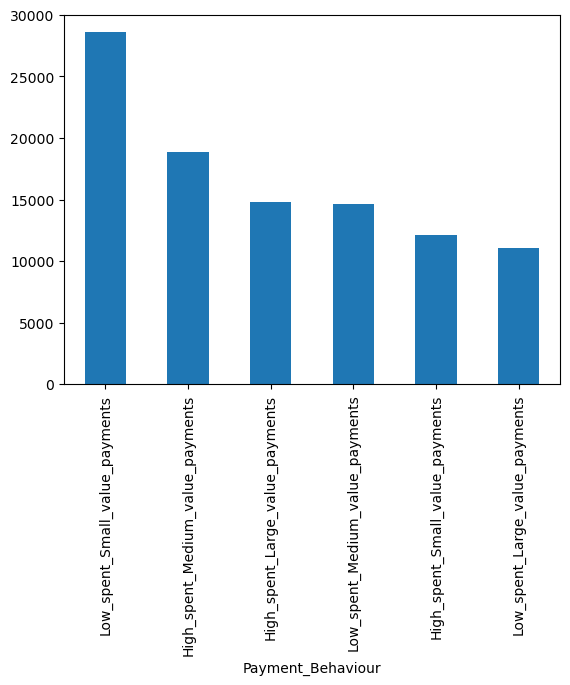

In [13]:
# checking categorical features
credit_df['Payment_Behaviour'].value_counts().plot.bar()

<Axes: >

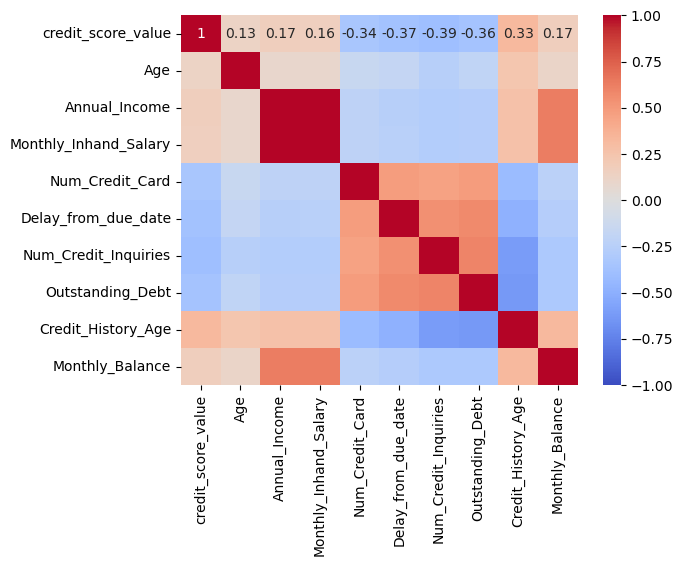

In [26]:
sns.heatmap(credit_df[['credit_score_value', 'Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Credit_Card', 'Delay_from_due_date', 'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_History_Age', 'Monthly_Balance']].corr(numeric_only=True), annot=True, vmin=-1, vmax=1, cmap='coolwarm')

<Axes: xlabel='credit_score_value', ylabel='Num_Credit_Card'>

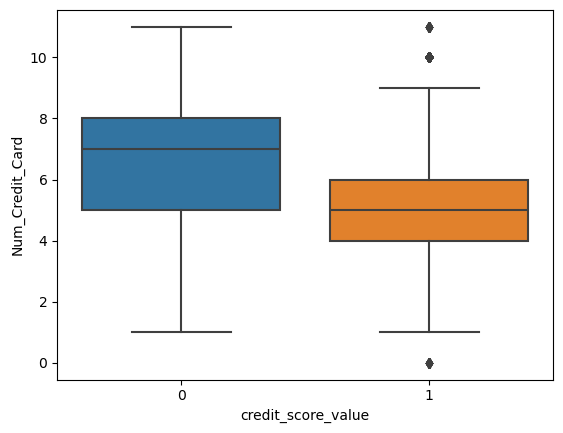

In [27]:
# checking target features relation
sns.boxplot(credit_df, x='credit_score_value', y='Num_Credit_Card')

<Axes: xlabel='credit_score_value', ylabel='Delay_from_due_date'>

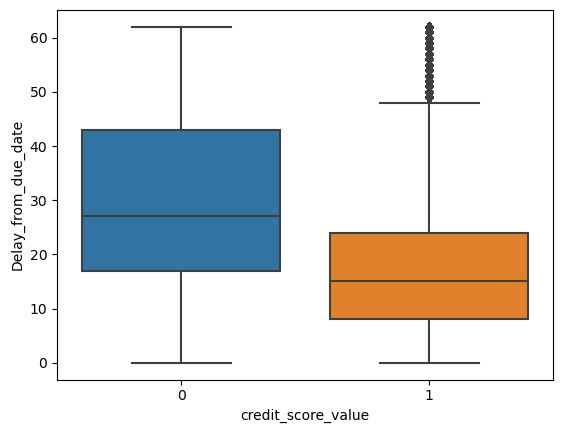

In [28]:
# checking target features relation
sns.boxplot(credit_df, x='credit_score_value', y='Delay_from_due_date')

<Axes: xlabel='credit_score_value', ylabel='Num_Credit_Inquiries'>

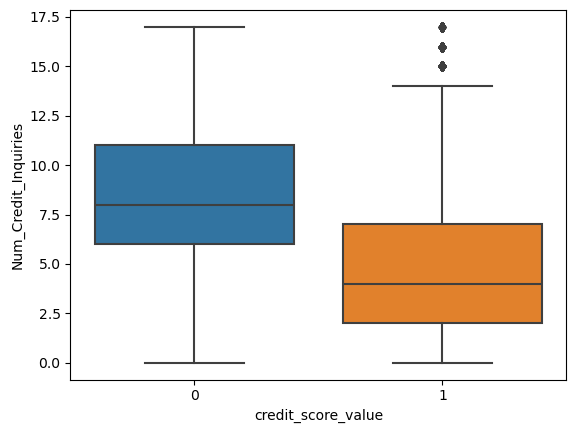

In [29]:
# checking target features relation
sns.boxplot(credit_df, x='credit_score_value', y='Num_Credit_Inquiries')

<Axes: xlabel='credit_score_value', ylabel='Outstanding_Debt'>

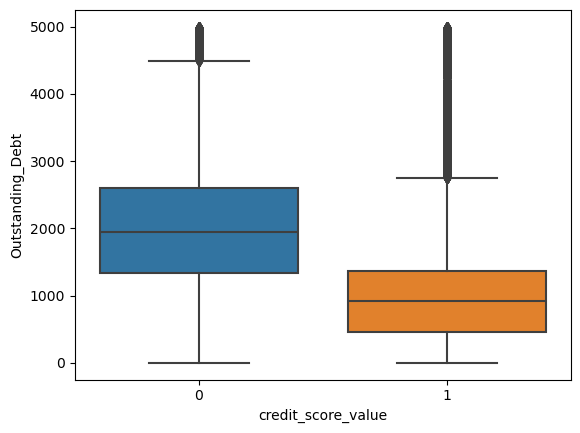

In [30]:
# checking target features relation
sns.boxplot(credit_df, x='credit_score_value', y='Outstanding_Debt')

<Axes: xlabel='credit_score_value', ylabel='Credit_History_Age'>

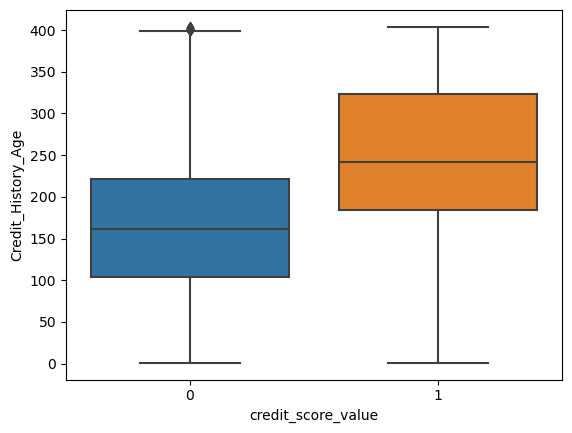

In [31]:
# checking target features relation
sns.boxplot(credit_df, x='credit_score_value', y='Credit_History_Age')

In [3]:
# feature engineering
credit_df['outstanding_debt_lower_1500'] = np.where(credit_df['Outstanding_Debt'] <= 1500, 1, 0)
credit_df['intrest_rate_lower_20'] = np.where(credit_df['Interest_Rate'] <= 20, 1, 0)
credit_df['num_credit_inquiries_lower_10'] = np.where(credit_df['Num_Credit_Inquiries'] < 10, 1, 0)
credit_df['num_of_loan_lower_5'] = np.where(credit_df['Num_of_Loan'] < 5, 1, 0)
credit_df['credit_history_age_higher_200'] = np.where(credit_df['Credit_History_Age'] >= 200, 1, 0)

# Logistic Regression with imbalanced data

At first we fit logistic regression on imbalanced data and  evaluate it using accuracy, precision, recall and f1 scores.

In [11]:
X = credit_df[['outstanding_debt_lower_1500', 'intrest_rate_lower_20', 'num_credit_inquiries_lower_10', 'num_of_loan_lower_5', 'credit_history_age_higher_200']]
Y = credit_df['credit_score_value']

In [12]:
X, X_test, Y, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1234)

In [6]:
# finding best hyperparameters
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('logreg', LogisticRegression(solver="saga", max_iter=10000))
])

# we can separate elasticnet from l1 and l2 to prevent l1_ratio warning
parameters = [
    {"logreg__C": np.linspace(0.1, 2, 20), "logreg__penalty": ["l1", "l2"]},
    {"logreg__C": np.linspace(0.1, 2, 20), "logreg__penalty": ["elasticnet"], "logreg__l1_ratio": np.linspace(0.1, 1, 10)}
]

gridsearch = GridSearchCV(pipeline, parameters)
gridsearch.fit(X, Y)
print(f"Best Params: {gridsearch.best_params_}")
print(f"Best Cross-Validation Accuracy: {gridsearch.best_score_:.4f}")

Best Params: {'logreg__C': 0.1, 'logreg__penalty': 'l1'}
Best Cross-Validation Accuracy: 0.7782


In [9]:
# this function calculates accuracy, precision, recall and f1 using cross validation
def scores_calculation(X, Y, accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores):
    for train_indices, valid_indices in kf.split(X, Y):
        std = StandardScaler()
        X_train_std = std.fit_transform(X.iloc[train_indices, :])
        Y_train = Y.iloc[train_indices]
        X_valid_std = std.transform(X.iloc[valid_indices, :])
        Y_valid = Y.iloc[valid_indices]
        model = LogisticRegression(C=0.1, penalty='l1', solver="saga", max_iter=10000)
        model.fit(X_train_std, Y_train)
        accuracy_train_scores.append(accuracy_score(Y_train, model.predict(X_train_std)))
        accuracy_valid_scores.append(accuracy_score(Y_valid, model.predict(X_valid_std)))
        precision_train_scores.append(precision_score(Y_train, model.predict(X_train_std)))
        precision_valid_scores.append(precision_score(Y_valid, model.predict(X_valid_std)))
        recall_train_scores.append(recall_score(Y_train, model.predict(X_train_std)))
        recall_valid_scores.append(recall_score(Y_valid, model.predict(X_valid_std)))
        f1_train_scores.append(f1_score(Y_train, model.predict(X_train_std)))
        f1_valid_scores.append(f1_score(Y_valid, model.predict(X_valid_std)))

In [10]:
from sklearn.model_selection import KFold

kf = KFold(n_splits=5, shuffle=True, random_state=1403)
accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores = [], [], [], [], [], [], [], []
scores_calculation(X, Y, accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores)
print(f'training data accuracy score: {np.mean(accuracy_train_scores)}')
print(f'validation data accuracy score: {np.mean(accuracy_valid_scores)}')
print(f'training data precision score: {np.mean(precision_train_scores)}')
print(f'validation data precision score: {np.mean(precision_valid_scores)}')
print(f'training data recall score: {np.mean(recall_train_scores)}')
print(f'validation data recall score: {np.mean(recall_valid_scores)}')
print(f'training data f1 score: {np.mean(f1_train_scores)}')
print(f'validation data f1 score: {np.mean(f1_valid_scores)}')

training data accuracy score: 0.7782000000000001
validation data accuracy score: 0.7782
training data precision score: 0.8278134941023125
validation data precision score: 0.8278156399573421
training data recall score: 0.8679202213960882
validation data recall score: 0.8679254640431872
training data f1 score: 0.8473918170170563
validation data f1 score: 0.8473842495256545


# Logsitic Regression with Balanced Data

1. OverSampling
2. SMOTE
3. Undersampling

## Oversampling

In [18]:
# finding best hyperparameters
import imblearn.over_sampling as over_sample
from imblearn.pipeline import Pipeline

n_pos = np.sum(Y == 1)
n_neg = np.sum(Y == 0)
ratio = {1: n_pos, 0: int(np.round(n_neg * 2.5))}

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('random_over_sample', over_sample.RandomOverSampler(sampling_strategy=ratio, random_state=1403)),
    ('logreg', LogisticRegression(solver="saga", max_iter=10000))
])

# we can separate elasticnet from l1 and l2 to prevent l1_ratio warning
parameters = [
    {"logreg__C": np.linspace(0.1, 2, 20), "logreg__penalty": ["l1", "l2"]},
    {"logreg__C": np.linspace(0.1, 2, 20), "logreg__penalty": ["elasticnet"], "logreg__l1_ratio": np.linspace(0.1, 1, 10)}
]

gridsearch = GridSearchCV(pipeline, parameters)
gridsearch.fit(X, Y)
print(f"Best Params: {gridsearch.best_params_}")
print(f"Best Cross-Validation Accuracy: {gridsearch.best_score_:.4f}")

Best Params: {'logreg__C': 0.1, 'logreg__penalty': 'l1'}
Best Cross-Validation Accuracy: 0.7907


In [22]:
# this function calculates accuracy, precision, recall and f1 using cross validation (this function uses random over sampler for managing imbalanced data)
def ros_scores_calculation(X, Y, accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores):
    n_pos = np.sum(Y == 1)
    n_neg = np.sum(Y == 0)
    ratio = {1: n_pos, 0: int(np.round(n_neg * 2.5))}
    ros = over_sample.RandomOverSampler(sampling_strategy=ratio, random_state=1403)
    std = StandardScaler()
    for train_indices, valid_indices in kf.split(X, Y):
        X_train_std = std.fit_transform(X.iloc[train_indices, :])
        Y_train = Y.iloc[train_indices]
        X_valid_std = std.transform(X.iloc[valid_indices, :])
        Y_valid = Y.iloc[valid_indices]
        X_train_std_os, Y_train_os = ros.fit_resample(X_train_std, Y_train)
        model = LogisticRegression(C=0.1, penalty='l1', solver="saga", max_iter=10000)
        model.fit(X_train_std_os, Y_train_os)
        accuracy_train_scores.append(accuracy_score(Y_train_os, model.predict(X_train_std_os)))
        accuracy_valid_scores.append(accuracy_score(Y_valid, model.predict(X_valid_std)))
        precision_train_scores.append(precision_score(Y_train_os, model.predict(X_train_std_os)))
        precision_valid_scores.append(precision_score(Y_valid, model.predict(X_valid_std)))
        recall_train_scores.append(recall_score(Y_train_os, model.predict(X_train_std_os)))
        recall_valid_scores.append(recall_score(Y_valid, model.predict(X_valid_std)))
        f1_train_scores.append(f1_score(Y_train_os, model.predict(X_train_std_os)))
        f1_valid_scores.append(f1_score(Y_valid, model.predict(X_valid_std)))

In [23]:
kf = KFold(n_splits=5, shuffle=True, random_state=1403)
accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores = [], [], [], [], [], [], [], []
ros_scores_calculation(X, Y, accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores)
print(f'training data accuracy score: {np.mean(accuracy_train_scores)}')
print(f'validation data accuracy score: {np.mean(accuracy_valid_scores)}')
print(f'training data precision score: {np.mean(precision_train_scores)}')
print(f'validation data precision score: {np.mean(precision_valid_scores)}')
print(f'training data recall score: {np.mean(recall_train_scores)}')
print(f'validation data recall score: {np.mean(recall_valid_scores)}')
print(f'training data f1 score: {np.mean(f1_train_scores)}')
print(f'validation data f1 score: {np.mean(f1_valid_scores)}')

training data accuracy score: 0.7698465074569689
validation data accuracy score: 0.7907
training data precision score: 0.7415344646360318
validation data precision score: 0.8767919203056576
training data recall score: 0.8201476365814555
validation data recall score: 0.8202988995555833
training data f1 score: 0.77885986702298
validation data f1 score: 0.8475852574326881


## SMOTE

In [ ]:
# finding best hyperparameters
import imblearn.over_sampling as over_sample
from imblearn.pipeline import Pipeline

n_pos = np.sum(Y == 1)
n_neg = np.sum(Y == 0)
ratio = {1: n_pos, 0: int(np.round(n_neg * 2.5))}

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('smote', over_sample.SMOTE(sampling_strategy=ratio, random_state=1403)),
    ('logreg', LogisticRegression(solver="saga", max_iter=10000))
])

# we can separate elasticnet from l1 and l2 to prevent l1_ratio warning
parameters = [
    {"logreg__C": np.linspace(0.1, 2, 20), "logreg__penalty": ["l1", "l2"]},
    {"logreg__C": np.linspace(0.1, 2, 20), "logreg__penalty": ["elasticnet"], "logreg__l1_ratio": np.linspace(0.1, 1, 10)}
]

gridsearch = GridSearchCV(pipeline, parameters)
gridsearch.fit(X, Y)
print(f"Best Params: {gridsearch.best_params_}")
print(f"Best Cross-Validation Accuracy: {gridsearch.best_score_:.4f}")

In [25]:
# this function calculates accuracy, precision, recall and f1 using cross validation (this function uses SMOTE for managing imbalanced data)
def smt_scores_calculation(X, Y, accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores):
    n_pos = np.sum(Y == 1)
    n_neg = np.sum(Y == 0)
    ratio = {1: n_pos, 0: int(np.round(n_neg * 2.5))}
    smt = over_sample.SMOTE(sampling_strategy=ratio, random_state=1403)
    std = StandardScaler()
    for train_indices, valid_indices in kf.split(X, Y):
        X_train_std = std.fit_transform(X.iloc[train_indices, :])
        Y_train = Y.iloc[train_indices]
        X_valid_std = std.transform(X.iloc[valid_indices, :])
        Y_valid = Y.iloc[valid_indices]
        X_train_std_os, Y_train_os = smt.fit_resample(X_train_std, Y_train)
        model = LogisticRegression(C=0.1, penalty='l1', solver="saga", max_iter=10000)
        model.fit(X_train_std_os, Y_train_os)
        accuracy_train_scores.append(accuracy_score(Y_train_os, model.predict(X_train_std_os)))
        accuracy_valid_scores.append(accuracy_score(Y_valid, model.predict(X_valid_std)))
        precision_train_scores.append(precision_score(Y_train_os, model.predict(X_train_std_os)))
        precision_valid_scores.append(precision_score(Y_valid, model.predict(X_valid_std)))
        recall_train_scores.append(recall_score(Y_train_os, model.predict(X_train_std_os)))
        recall_valid_scores.append(recall_score(Y_valid, model.predict(X_valid_std)))
        f1_train_scores.append(f1_score(Y_train_os, model.predict(X_train_std_os)))
        f1_valid_scores.append(f1_score(Y_valid, model.predict(X_valid_std)))

In [26]:
kf = KFold(n_splits=5, shuffle=True, random_state=1403)
accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores = [], [], [], [], [], [], [], []
smt_scores_calculation(X, Y, accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores)
print(f'training data accuracy score: {np.mean(accuracy_train_scores)}')
print(f'validation data accuracy score: {np.mean(accuracy_valid_scores)}')
print(f'training data precision score: {np.mean(precision_train_scores)}')
print(f'validation data precision score: {np.mean(precision_valid_scores)}')
print(f'training data recall score: {np.mean(recall_train_scores)}')
print(f'validation data recall score: {np.mean(recall_valid_scores)}')
print(f'training data f1 score: {np.mean(f1_train_scores)}')
print(f'validation data f1 score: {np.mean(f1_valid_scores)}')

training data accuracy score: 0.7695661637311834
validation data accuracy score: 0.7911125
training data precision score: 0.7412565721876885
validation data precision score: 0.8775140488668367
training data recall score: 0.8199150825390673
validation data recall score: 0.8200879553870151
training data f1 score: 0.7786024022613477
validation data f1 score: 0.8478058698414724


## Undersampling

In [ ]:
# finding best hyperparameters
import imblearn.under_sampling as under_sample
from imblearn.pipeline import Pipeline

n_pos = np.sum(Y == 1)
n_neg = np.sum(Y == 0)
minor_pct = 0.4

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('random_under_sampler', under_sample.RandomUnderSampler(sampling_strategy=(minor_pct/(1-minor_pct)), random_state=1403)),
    ('logreg', LogisticRegression(solver="saga", max_iter=10000))
])

# we can separate elasticnet from l1 and l2 to prevent l1_ratio warning
parameters = [
    {"logreg__C": np.linspace(0.1, 2, 20), "logreg__penalty": ["l1", "l2"]},
    {"logreg__C": np.linspace(0.1, 2, 20), "logreg__penalty": ["elasticnet"], "logreg__l1_ratio": np.linspace(0.1, 1, 10)}
]

gridsearch = GridSearchCV(pipeline, parameters)
gridsearch.fit(X, Y)
print(f"Best Params: {gridsearch.best_params_}")
print(f"Best Cross-Validation Accuracy: {gridsearch.best_score_:.4f}")

In [32]:
# this function calculates accuracy, precision, recall and f1 using cross validation (this function uses random under sampler for managing imbalanced data)
def rus_scores_calculation(X, Y, accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores):
    n_pos = np.sum(Y == 1)
    n_neg = np.sum(Y == 0)
    minor_pct = 0.4
    rus = under_sample.RandomUnderSampler(sampling_strategy=(minor_pct/(1-minor_pct)), random_state=1403)
    std = StandardScaler()
    for train_indices, valid_indices in kf.split(X, Y):
        X_train_std = std.fit_transform(X.iloc[train_indices, :])
        Y_train = Y.iloc[train_indices]
        X_valid_std = std.transform(X.iloc[valid_indices, :])
        Y_valid = Y.iloc[valid_indices]
        X_train_std_os, Y_train_os = rus.fit_resample(X_train_std, Y_train)
        model = LogisticRegression(C=0.1, penalty='l1', solver="saga", max_iter=10000)
        model.fit(X_train_std_os, Y_train_os)
        accuracy_train_scores.append(accuracy_score(Y_train_os, model.predict(X_train_std_os)))
        accuracy_valid_scores.append(accuracy_score(Y_valid, model.predict(X_valid_std)))
        precision_train_scores.append(precision_score(Y_train_os, model.predict(X_train_std_os)))
        precision_valid_scores.append(precision_score(Y_valid, model.predict(X_valid_std)))
        recall_train_scores.append(recall_score(Y_train_os, model.predict(X_train_std_os)))
        recall_valid_scores.append(recall_score(Y_valid, model.predict(X_valid_std)))
        f1_train_scores.append(f1_score(Y_train_os, model.predict(X_train_std_os)))
        f1_valid_scores.append(f1_score(Y_valid, model.predict(X_valid_std)))

In [33]:
kf = KFold(n_splits=5, shuffle=True, random_state=1403)
accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores = [], [], [], [], [], [], [], []
rus_scores_calculation(X, Y, accuracy_train_scores, accuracy_valid_scores, precision_train_scores, precision_valid_scores, recall_train_scores, recall_valid_scores, f1_train_scores, f1_valid_scores)
print(f'training data accuracy score: {np.mean(accuracy_train_scores)}')
print(f'validation data accuracy score: {np.mean(accuracy_valid_scores)}')
print(f'training data precision score: {np.mean(precision_train_scores)}')
print(f'validation data precision score: {np.mean(precision_valid_scores)}')
print(f'training data recall score: {np.mean(recall_train_scores)}')
print(f'validation data recall score: {np.mean(recall_valid_scores)}')
print(f'training data f1 score: {np.mean(f1_train_scores)}')
print(f'validation data f1 score: {np.mean(f1_valid_scores)}')

training data accuracy score: 0.7719106505893142
validation data accuracy score: 0.786225
training data precision score: 0.8024862766896235
validation data precision score: 0.8689489250704169
training data recall score: 0.8222197675353244
validation data recall score: 0.82279971083059
training data f1 score: 0.8122320708082382
validation data f1 score: 0.8452310709964992


## Final Model

we can see that SMOTE had the best result, but random over sampler has better performance and has results nearly as good as SMOTE. so we choose random over sampler as our final model

In [34]:
n_pos = np.sum(Y == 1)
n_neg = np.sum(Y == 0)
ratio = {1: n_pos, 0: int(np.round(n_neg * 2.5))}
ros = over_sample.RandomOverSampler(sampling_strategy=ratio, random_state=1403)
X_os, Y_os = ros.fit_resample(X, Y)

In [35]:
std = StandardScaler()
X_std_os = std.fit_transform(X_os)
X_test_std = std.transform(X_test)

In [36]:
model = LogisticRegression(C=0.1, penalty='l1', solver="saga", max_iter=10000)
model.fit(X_std_os, Y_os)

LogisticRegression(C=0.1, max_iter=10000, penalty='l1', solver='saga')

In [37]:
print(f"model's accuracy score: {accuracy_score(Y_test, model.predict(X_test_std))}")
print(f"model's precision score: {precision_score(Y_test, model.predict(X_test_std))}")
print(f"model's recall score: {recall_score(Y_test, model.predict(X_test_std))}")
print(f"model's f1 score: {f1_score(Y_test, model.predict(X_test_std))}")

model's accuracy score: 0.7885
model's precision score: 0.8770053475935828
model's recall score: 0.8176392107295836
model's f1 score: 0.8462824333163748
